# Neural-Network OBC on the 2-Layer Baroclinic Jet  `[2L][TEST]`

Testing a trained `OBCNet` on the **2-layer** model — no training here. Structure mirrors
`Neural_Net/NN_test_only_general.ipynb`; the scenario is the **same configuration** as
`2D_orlanski/No-periodicity-NS-2-layer-baroclinic-jet.ipynb` (compensated baroclinic jet,
`g=[0.08, 0.06]`, `Ho=[400, 400]`, dt=200 s, `b_obc=150`, same sponges/walls).

**Flow**
1. **Load a trained `OBCNet`** from a `Stored_Runs/<folder>/obc_net_<CONFIG>.pth` checkpoint.
   Architecture is inferred from the *weight shapes* (metadata has no `hidden` key).
2. **Control run** — regenerate fresh (`RUN_CONTROL = True`, cached to a new folder) or reuse
   an existing `control_run_cache_2layer.npz` (`RUN_CONTROL = False`).
3. **Two free-running rollouts** from the same IC, driven by the stored western boundary data:
   - **classical** — native in-step per-layer 2D Orlanski (`run_obc`)
   - **neural** — `run_obc_nn(phase_fn = nn_phase_fn, ...)`, network `(rx, ry)` applied per layer
4. **Diagnostics**: per-layer interior RMS vs truth (u, v, and η₀ / η₁ — *not* `h - D`),
   2-layer interior energy (KE + PE with `½g₀η₀² + ½g'η₁²`, absolute interfaces), RMS-region
   schematic, per-layer NN-vs-classical phase-speed Hovmöllers, optional animations.

Both runs use the **single module** `Remove_periodicity_2D_NS_orlanski_2layer.py` in this
folder — identical stepper, walls, sponges, `eps_denom` — so the comparison isolates the
boundary treatment. **One caveat**: the two drivers differ in *structure*, not only in where
`(rx, ry)` comes from. `run_obc` is **in-step** (`obc_on=1`): the Orlanski-updated `h` at
column `b` feeds that same step's Montgomery potential and pressure gradient. `run_obc_nn` is
**out-of-step** (`obc_on=0`): column `b` steps freely and is overwritten in numpy afterwards.
That difference is inherited from the original NN driver and is part of what is being compared.
New/glue lines are tagged `# [2L]` / `# [TEST]`.

---
### ⚠️ Read before interpreting results — the network is 1-layer-trained
The checkpoint was trained on the **1-layer reduced-gravity** jet and its input is
`n_in = 11` = 8 stencil values + a **3-wide field one-hot** (h/u/v). There is **no layer
identity** in the input, and the per-sample min–max normalisation erases amplitude, so:

* the *same* network is applied to layer 0 and layer 1 rows, and it **cannot tell them apart**;
* it was never shown a two-mode (barotropic + baroclinic) stencil, where the pointwise
  phase speed is the speed of *neither* mode.

Two further train/test mismatches are baked into this checkpoint and are **not** layer-related,
so a poor NN result here cannot be blamed on "2 layers" alone:

* **Spin-up**: training discarded the first `STABLE_START = 10000` steps. This test rolls out
  from the balanced IC at *t = 0*, so the first ~23 days — the window every RMS curve starts
  in — are a regime the net never saw.
* **External forcing**: the net was trained with **frozen-IC** `phi_ext`, while `EXT_MODE`
  defaults to `'probe'` (perfect forcing) to match the 2-layer Orlanski notebook. Set
  `EXT_MODE = 'frozen_ic'` to test the net in-distribution instead.

This notebook therefore measures **"how does a 1-layer-trained OBCNet transfer to 2 layers?"**
— an honest zero-shot transfer test, not a trained-for-2-layers result. A 2-layer-native net
needs a layer one-hot (`n_in` 11 → 13) or modal channels, plus retraining. Given the prior
1-layer finding (the net was 6–9× *worse* than analytic even offline), expect the analytic
Orlanski to win here; the value of this notebook is the per-layer/per-mode breakdown of *how*
it fails, which is what a 2-layer-native design has to fix.

In [1]:
import sys
sys.path.insert(0, '.')                                    # [2L] the 2-layer module lives in this folder (2D_orlanski)

import matplotlib.pyplot as plt
import numpy as np

# [2L] ONE module drives everything: control record (+[CL]), classical run_obc,
# [2L] and the neural run_obc_nn -- identical stepper/walls/sponges for every run.
from Remove_periodicity_2D_NS_orlanski_2layer import SSWEM

import os
os.environ.setdefault('KMP_DUPLICATE_LIB_OK',   'TRUE')   # avoid libiomp clash (torch + numpy/MKL)
import torch
from torch import nn
import importlib

## Configuration  `[2L][TEST]`

In [2]:
CONFIG   = 'multifield'          # [TEST] set MANUALLY; must match the loaded checkpoint (warned if not)

# Control run: True  -> regenerate a fresh 2-layer control sim (kept in memory)
#              False -> reuse an existing control_run_cache_2layer.npz (scenario comes from that cache)
RUN_CONTROL  = True              # [TEST]

# [2L] Whether to WRITE the freshly generated control run to disk. Decoupled from RUN_CONTROL:
#   RUN_CONTROL=True , STORE_CONTROL=True  -> generate AND cache (reusable later via RUN_CONTROL=False)
#   RUN_CONTROL=True , STORE_CONTROL=False -> generate in memory only, write NOTHING (default:
#                                             you usually don't need a fresh 50k-step cache every run)

# If storing the control run cache (storing takes time)
STORE_CONTROL = False          

assert CONFIG in ('base_h', 'multifield', 'multifield_inflow')   # [TEST]
CFG_MULTIFIELD  = CONFIG in ('multifield', 'multifield_inflow')   # [TEST]
CFG_INFLOW_CORR = CONFIG == 'multifield_inflow'                   # [TEST]
CFG_FIELDS      = ('h', 'u', 'v') if CFG_MULTIFIELD else ('h',)   # [TEST]
CFG_N_OUT       = 3 if CFG_INFLOW_CORR else 2                     # [TEST]
CFG_FIELD_CODES = (0, 1, 2) if CFG_MULTIFIELD else (0,)           # [TEST]
DO_TRAIN = False                 # [TEST] never train in this notebook

# ---- [2L] knobs that decide how faithfully we reproduce the 2-layer Orlanski notebook ----
# ALPHA_IN_SOURCE: 'notebook'   -> ALPHA_IN = dt/(TAU_IN_DAYS*86400), the SAME expression as
#                                  No-periodicity-NS-2-layer-baroclinic-jet.ipynb cell 20
#                                  (tau_in = 2 days -> 1.157e-3 at dt=200 s)
#                 'checkpoint'  -> take alpha_in from the trained model's metadata
#                                  (what the net was TRAINED with)
# For this checkpoint the two happen to AGREE (both 1.157e-3): the net was trained with the
# same dt/(2 days) rule. Both rollouts always share the SAME ALPHA_IN, so classical-vs-NN
# stays like-for-like. Note alpha_in=0 would make the inflow pure persistence and would make
# phi_ext (and therefore EXT_MODE) a no-op -- the ext column is multiplied by alpha_in.
ALPHA_IN_SOURCE = 'notebook'     # [2L] 'notebook' | 'checkpoint'
TAU_IN_DAYS     = 2              # [2L] inflow nudging timescale [days], as in the 2-layer nb

# EXT_MODE: 'probe'     -> perfect external forcing
#           'frozen_ic' -> initial condition as the external forcing. 
EXT_MODE = 'frozen_ic'               # [2L] 'probe' | 'frozen_ic'

# NN_LAYERS: which layers the network drives. The net has NO layer identity (see the header),
#            so this is how you isolate its effect per layer.
#   'all'  -> NN sets (rx,ry) on both layers  (the headline zero-shot transfer test)
#   'top'  -> NN on layer 0 only; layer 1 keeps the analytic Orlanski phase speed
#   'deep' -> NN on layer 1 only; layer 0 analytic
NN_LAYERS = 'all'                # [2L] 'all' | 'top' | 'deep'

# [2L] validate the knobs: each is consumed by an `if x == ...: else: <default>` further down,
# [2L] so a typo would silently run the DEFAULT while the print below echoes the typo back.
assert ALPHA_IN_SOURCE in ('notebook', 'checkpoint'), f'bad ALPHA_IN_SOURCE={ALPHA_IN_SOURCE!r}'   # [2L]
assert EXT_MODE in ('probe', 'frozen_ic'), f'bad EXT_MODE={EXT_MODE!r}'                            # [2L]
assert NN_LAYERS in ('all', 'top', 'deep'), f'bad NN_LAYERS={NN_LAYERS!r}'                         # [2L]

print(f'[2L] CONFIG={CONFIG!r}  RUN_CONTROL={RUN_CONTROL}  STORE_CONTROL={STORE_CONTROL}  '
      f'ALPHA_IN_SOURCE={ALPHA_IN_SOURCE!r}  EXT_MODE={EXT_MODE!r}  NN_LAYERS={NN_LAYERS!r}')

[2L] CONFIG='multifield'  RUN_CONTROL=True  STORE_CONTROL=False  ALPHA_IN_SOURCE='notebook'  EXT_MODE='frozen_ic'  NN_LAYERS='all'


## Run folder & trained-model source  `[TEST]`

In [3]:
import os                                                              # [TEST]
from datetime import datetime                                            # [TEST]

BASE_RUNS   = r'D:\Documents\College\Research\Oceangrophy\Princeton_Summer\OSSWEM\Neural_Net\Stored_Runs'  # [TEST]

# Where to load the trained Neural Network
MODEL_FROM  = '20260716_1322_multifield'      

# Control run data from? Only used then CONTROL_RUN = TRUE
CONTROL_FROM = ''                                

CACHE_NAME = 'control_run_cache_2layer.npz'       

# [2L] the knobs ARE the experiment -- put them in the run tag / artifact names so a folder
# [2L] (or a GIF) can never be mistaken for a different variant's output.
KNOB_TAG = f'{NN_LAYERS}_{EXT_MODE}_a-{ALPHA_IN_SOURCE}'              

if RUN_CONTROL:                                                       
    _stamp   = datetime.now().strftime('%Y%m%d_%H%M')                  
    RUN_TAG  = f'{_stamp}_2layer_test_{CONFIG}_{KNOB_TAG}'             
    DATA_DIR = os.path.join(BASE_RUNS, RUN_TAG)                       
    os.makedirs(DATA_DIR, exist_ok=True)                               
    print(f'[TEST] RUN_CONTROL=True (STORE_CONTROL={STORE_CONTROL}) -> output folder: {DATA_DIR}')   
    if not STORE_CONTROL:                                             
        print('[2L] STORE_CONTROL=False -> the control run stays in memory; no control_run_cache is written '
              '(GIFs/results still land in this folder).')
else:                                                                 
    if not CONTROL_FROM:                                               
        raise ValueError('[2L] RUN_CONTROL=False needs CONTROL_FROM set to a run folder')   
    DATA_DIR = os.path.join(BASE_RUNS, CONTROL_FROM)                  
    if not os.path.isfile(os.path.join(DATA_DIR, CACHE_NAME)):      
        raise FileNotFoundError(                                      
            f"[TEST] RUN_CONTROL=False but no {CACHE_NAME} under {DATA_DIR}. "
            f"Set CONTROL_FROM to a folder that has one, or set RUN_CONTROL=True to regenerate.")
    print(f'[TEST] RUN_CONTROL=False -> reuse control cache in: {DATA_DIR}')  

def P(name): return os.path.join(DATA_DIR, name)                       
CKPT = P(f'obc_net_{CONFIG}.pth')   
# resolve the trained-model checkpoint to actually load                
if str(MODEL_FROM).endswith('.pth'):                                  
    CKPT_LOAD = MODEL_FROM                                             
else:                                                                 
    CKPT_LOAD = os.path.join(BASE_RUNS, MODEL_FROM, f'obc_net_{CONFIG}.pth')   
if not os.path.isfile(CKPT_LOAD):                                     
    raise FileNotFoundError(f'[TEST] trained model not found: {CKPT_LOAD}')    
print(f'[TEST] TEST will load model from: {CKPT_LOAD}')               
print(f'[TEST] CONFIG={CONFIG!r}  fields={CFG_FIELDS}  n_out={CFG_N_OUT}  '
      f'field_codes={CFG_FIELD_CODES}  inflow_corr={CFG_INFLOW_CORR}')

[TEST] RUN_CONTROL=True (STORE_CONTROL=False) -> output folder: D:\Documents\College\Research\Oceangrophy\Princeton_Summer\OSSWEM\Neural_Net\Stored_Runs\20260716_2346_2layer_test_multifield_all_frozen_ic_a-notebook
[2L] STORE_CONTROL=False -> the control run stays in memory; no control_run_cache is written (GIFs/results still land in this folder).
[TEST] TEST will load model from: D:\Documents\College\Research\Oceangrophy\Princeton_Summer\OSSWEM\Neural_Net\Stored_Runs\20260716_1322_multifield\obc_net_multifield.pth
[TEST] CONFIG='multifield'  fields=('h', 'u', 'v')  n_out=2  field_codes=(0, 1, 2)  inflow_corr=False


# SETUP & CONTROL RUN  `[2L]`
The cells below build the 2-layer model `M` and (optionally) **generate** the control run.
They run **only when `RUN_CONTROL = True`**. When reusing a cache, everything is rebuilt
from `control_run_cache_2layer.npz` in the *Reload* cell further down.

Scenario is copied verbatim from `No-periodicity-NS-2-layer-baroclinic-jet.ipynb`.

### Parameters, baroclinic jet, sponge (control scenario knobs)

mesh: ni = 250  nj = 180
Grid: dx = 10000.0 [m]  dy = 10000.0 [m]
cg = 8.0 [m s-1]
Ld = 80000.0 [m]
cg1 = 3.4641016151377544 [m s-1]
Ld1 = 34641.016151377546 [m]
Scales: Ls=epsilon/D/beta = None [m]
Scales: Lx/Ld = 31.25
Scales: Lx/Ld1 = 72.16878364870323
Res: Ld/dx = 8.0
Res: Ld1/dx = 3.4641016151377544
[2L] exact modes: c_bt=8.842 m/s (Courant 0.177)   c_bc=3.134 m/s (Courant 0.063)
[2L] min h per layer (t=0) = [312.98611111 339.85275954] m   tilts: surface 75.0 m, interface 100.0 m


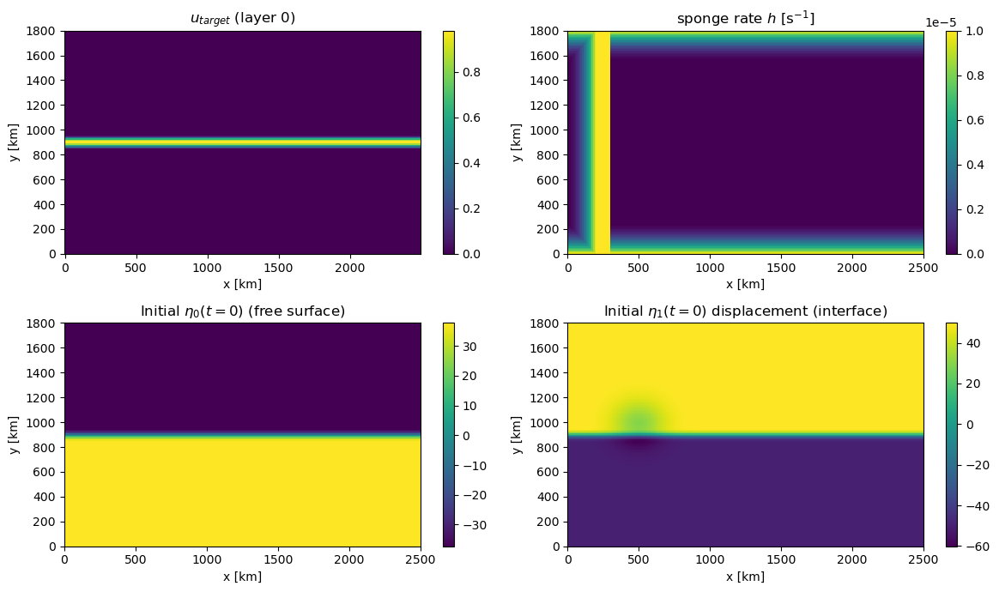

In [4]:
if RUN_CONTROL:                                                   # [TEST] gate: only build/run the control when regenerating
    # Baroclinic instability in a channel: a balanced upper-layer zonal jet maintained by a
    # localized western sponge (f-plane).   [2L] same scenario as the 2-layer Orlanski notebook

    # nj, run_params = [dt, steps/segment, segments]
    nj, run_params = 180, [200., 1000, 50]  # Coarsest resolution with good instabilities

    # Resolution and Length Setting
    dx = 10.e3
    Lx = 2500.e3

    # [2L] 2-layer stack g = [g0, g'] with BOTH modes slow (g0 = 0.08 as in the 1-layer
    # [2L] reduced-gravity run keeps dt = 200 s valid). Exact modes: c_bt=8.84, c_bc=3.13 m/s.
    g0, gp = 0.08, 0.06        # [2L] surface / reduced gravity [m s-2]
    H1, H2 = 400., 400.        # [2L] nominal layer thicknesses [m] (total 800 m as in the 1-layer run)

    M = SSWEM(int(Lx / dx),
              [g0, gp], # [2L] gravity per interface [m s-2]; len(g)=2 -> nk=2
              [H1, H2], # [2L] nominal layer thickness per layer [m]
              Lx,  # Domain width [m]
              1e-4,   # Coriolis [s-1]
              0, # df/dy [m-1 s-1]
              2.5e-5,  # Bottom drag rate [m s-1]   # [2L] at nk=2 this acts on the BOTTOM layer only
              2e2,     # Lateral viscosity [m2 s-1]
              nj=nj,    # Rectangular channel
              )
    # [2L] nu_v (interfacial vertical viscosity) left at 0: layers couple through pressure only.

    # Single BAROCLINIC jet: upper layer carries the jet, deep-layer target at rest        # [2L]
    M.set_u_target_jet([1.0, 0.0])   # [2L] per-layer amplitudes

    # ================= [2L] Two-layer balanced state (deep layer at rest) ==================
    # [2L] Montgomery potentials used by the stepper: M0 = g0*eta0, M1 = M0 + gp*eta1.
    # [2L] Layer-0 geostrophy  f u0 = -dM0/dy  ->  deta0/dy = -f*u0/g0    (free surface)
    # [2L] Layer-1 at rest     dM1/dy = 0      ->  deta1/dy = +f*u0/gp    (Margules interface)
    uy  = M.u_target[0].mean(axis=1)                   # u(y) of the upper-layer jet
    f_h = M.fo + M.beta * M.yh1                        # f(y) at row centres
    eta0_d = -(1.0/M.g[0]) * np.cumsum(f_h * uy) * M.dy   # [2L] free-surface displacement [m]
    eta0_d -= eta0_d.mean()                              # [2L] zero domain mean
    eta1_d = +(1.0/M.g[1]) * np.cumsum(f_h * uy) * M.dy   # [2L] interface displacement [m] (Margules)
    eta1_d -= eta1_d.mean()                              # [2L]

    eta0_abs = eta0_d[:, None] + 0.0 * M.D                # [2L] (nj, ni) free surface
    eta1_abs = -M.Ho[0] + eta1_d[:, None] + 0.0 * M.D     # [2L] (nj, ni) internal interface
    h0bal = np.maximum(eta0_abs - eta1_abs, 0.0)          # [2L] balanced upper-layer thickness
    h1bal = np.maximum(eta1_abs + M.D, 0.0)               # [2L] balanced lower-layer thickness
    for _hb in (h0bal, h1bal):                            # [2L] wall-row clamps
        _hb[0, :] = _hb[1, 1]                             # [2L]
        _hb[-1, :] = _hb[-2, 1]                           # [2L]

    # ============================= Sponge Layer Setup ==============================================
    factor = 1.5
    def ramp(x, x0, Lx, p=2): return np.clip((x - x0)/(Lx - x0), 0, 1)**p
    def ramp2(x, x0, Lx, factor=1.5): return np.clip(factor*(x - x0)/(Lx - x0), 0, 1)**2
    rate_h, rate_uv, Lw_uv, Lw_h, yb = 1.e-5, 1.e-5, 300.e3, 300.e3, 250e3

    rate_h_ns = rate_h
    rate_uv_ns = rate_uv

    ratio_temp = 0
    width = ratio_temp * Lw_uv

    M.u_relax  = rate_uv * np.maximum( np.maximum( ramp2(M.xu, 0., Lw_uv) * (M.xu < Lw_uv + width), ramp(M.yu, M.Ly - yb, M.Ly) ), ramp(M.Ly - M.yu, M.Ly - yb, M.Ly) )
    M.v_relax  = rate_uv * np.maximum( np.maximum( ramp2(M.xv, 0., Lw_uv) * (M.xv < Lw_uv + width), ramp(M.yv, M.Ly - yb, M.Ly) ), ramp(M.Ly - M.yv, M.Ly - yb, M.Ly) )
    M.h_relax  = rate_h * np.maximum( np.maximum( ramp2(M.xh, 0., Lw_uv) * (M.xh < Lw_uv + width), ramp(M.yh, M.Ly - yb, M.Ly) ), ramp(M.Ly - M.yh, M.Ly - yb, M.Ly) )
    M.h_target = np.stack([h0bal, h1bal])              # [2L] per-layer (2, nj, ni) target

    #====================================== END ======================================================

    # Balanced initial state everywhere + a small smooth perturbation to seed eddies
    M.u[:] = M.u_target.copy()                         # [2L] both layers (deep layer starts at rest)
    M.h[0] = h0bal.copy()                              # [2L]
    M.h[1] = h1bal.copy()                              # [2L]
    # [2L] seed BAROCLINIC eddies: interface-only displacement (free surface stays flat)
    M.perturb_h(+20., 0.05 * M.Lx, 5.e5, 0.55 * M.Ly, k=0)   # [2L]
    M.perturb_h(-20., 0.05 * M.Lx, 5.e5, 0.55 * M.Ly, k=1)   # [2L]

    # [2L] safety: CFL for both modes + no layer outcropping (see the 2-layer Orlanski notebook)
    _dt = run_params[0]
    _B = np.array([[M.g[0]*M.Ho[0],  M.g[0]*M.Ho[0]],
                   [M.g[0]*M.Ho[1], (M.g[0]+M.g[1])*M.Ho[1]]])
    c_bt, c_bc = np.sqrt(np.sort(np.linalg.eigvals(_B))[::-1])
    print(f'[2L] exact modes: c_bt={c_bt:.3f} m/s (Courant {_dt*c_bt/M.dx:.3f})   '
          f'c_bc={c_bc:.3f} m/s (Courant {_dt*c_bc/M.dx:.3f})')
    print(f'[2L] min h per layer (t=0) = {M.h.min(axis=(1,2))} m   '
          f'tilts: surface {eta0_d.max()-eta0_d.min():.1f} m, interface {eta1_d.max()-eta1_d.min():.1f} m')
    assert M.h.min() > 50., '[2L] a layer is close to outcropping -- raise gp / thicken / weaken the jet'

    # Setup diagnostics
    fig, ax = plt.subplots(2, 2, figsize=(12, 7))
    cs = ax[0,0].pcolormesh( M.xq1/1e3, M.yh1/1e3, M.u_target[0] ); fig.colorbar(cs, ax=ax[0,0]); ax[0,0].set_title(r'$u_{target}$ (layer 0)')
    cs = ax[0,1].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.h_relax[0] ); fig.colorbar(cs, ax=ax[0,1]); ax[0,1].set_title(r'sponge rate $h$ [s$^{-1}$]')
    cs = ax[1,0].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) ); fig.colorbar(cs, ax=ax[1,0]); ax[1,0].set_title(r'Initial $\eta_0(t=0)$ (free surface)')
    cs = ax[1,1].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=1) - (-M.D + M.Ho[1]) ); fig.colorbar(cs, ax=ax[1,1]); ax[1,1].set_title(r'Initial $\eta_1(t=0)$ displacement (interface)')
    for a in ax.ravel():
        a.set_xlabel('x [km]'); a.set_ylabel('y [km]')
    fig.tight_layout()

In [5]:
if RUN_CONTROL:                                                   # [TEST] gate
    assert Lw_uv == Lw_h, "The SPonge Layer width of u,v is different from h"
    n_bc = int(Lw_uv / dx)
    i_edge  = np.where(M.xh1 < Lw_uv + width)[0].max()
    west_cols = np.arange(i_edge - n_bc + 1, i_edge + 1)
    print(f'[OBC] {n_bc} boundary columns i = {list(west_cols)},')
    ic = (M.u.copy(), M.v.copy(), M.h.copy(), M.time, M.iter)

[OBC] 30 boundary columns i = [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29)],


In [6]:
if RUN_CONTROL:                                                   # [TEST] gate
    b_obc      = 150                                            # [2L] same OBC column as the 2-layer Orlanski notebook
    b_obc_test = 150                                            # [OBC-TEST] test-run OBC location
    ext_cols   = np.array([b_obc + 1, b_obc + 2])
    # [2L] probe band only needs the OBC stencil {b-2, b-1, b} (no training data is packed here)
    probe_hi   = max(int(b_obc), int(b_obc_test))
    probe_lo   = min(int(b_obc), int(b_obc_test)) - 2
    band_w     = probe_hi - probe_lo + 1
    icol       = lambda c: int(c) - probe_lo
    assert probe_lo <= int(b_obc_test) - 2 and probe_hi >= int(b_obc_test), \
        'probe band must cover the test OBC stencil {b_obc_test-2, b_obc_test-1, b_obc_test}'   # [OBC-TEST]
    print(f'[2L] probe band i = {probe_lo}..{probe_hi} ({band_w} cols); b_obc={b_obc}, b_obc_test={b_obc_test}')

[2L] probe band i = 148..150 (3 cols); b_obc=150, b_obc_test=150


In [7]:
if RUN_CONTROL:                                                   # [TEST] gate
    SPONGE_BUFFER = 250e3
    dist_wall     = np.minimum(M.yh1, M.Ly - M.yh1)
    # Find the sponge row: which rows have a non-zero sponge rate at the OBC column
    sponge_row    = M.h_relax[0, :, int(b_obc)] > 0        # [2L] layer 0 slice; the sponge is layer-uniform here
    sponge_reach  = float(dist_wall[sponge_row].max())
    row_keep      = dist_wall > (sponge_reach + SPONGE_BUFFER)

    pres_cols = np.concatenate([west_cols])
    ic = (M.u.copy(), M.v.copy(), M.h.copy(), M.time, M.iter)

### Generate & cache the control run

In [8]:
if RUN_CONTROL:                                                             # [STORE] run the control simulation ONCE
    u, v, h, time, h_bc_all, u_bc_all, v_bc_all, probe_band = M.run_record_bc(
        *run_params, pres_cols, store_downstream=True, probe_i0=probe_lo, n_probe=band_w)
    nsteps = h_bc_all.shape[0]                                               # [STORE] full test-run length

    # [2L] Keep the PERFECT-PROBE column (the OBC column recorded at b_obc_test, every step,
    # [2L] both layers) -> (nsteps, nk, nj). This is the raw material for EXT_MODE='probe';
    # [2L] 'frozen_ic' is rebuilt from ic. Both ingredients are retained (+ cached), so the
    # [2L] actual external forcing is assembled LATER in the re-runnable "External forcing"
    # [2L] cell -> EXT_MODE can be switched without re-running this (expensive) control.
    h_ext_probe_all = np.ascontiguousarray(probe_band['h'][..., icol(b_obc_test)])
    u_ext_probe_all = np.ascontiguousarray(probe_band['u'][..., icol(b_obc_test)])
    v_ext_probe_all = np.ascontiguousarray(probe_band['v'][..., icol(b_obc_test)])
    del probe_band                                                          # [2L] only the b_obc_test column is needed
    import gc; gc.collect()
    print(f'[CTRL] control run done; {nsteps} steps; perfect-probe column {h_ext_probe_all.shape}')
else:
    print('[CTRL] RUN_CONTROL=False -> control run skipped; data loaded from disk below')

numba threads = 16
CFL: dt*f = 0.02
CFL: dt*cg/dx = 0.16
CFL: dt*cg1/dx = 0.06928203230275509
CFL: dt*nu_h/dx^2 = 0.0004
CFL*: dt*epsilon/h_bot = 1.25e-05
CFL*: dt*nu_v/h_min^2 = 0.0
CFL*: dt*h_relax = 0.002
CFL*: dt*u_relax = 0.002
CFL*: dt*v_relax = 0.002
nsteps = 50000
Time: Trun * fo = 1000.0
Time: Trun * ( cg / L ) = 32.0
[OBC] recording (u,v,h) at boundary columns i = [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14), np.int64(15), np.int64(16), np.int64(17), np.int64(18), np.int64(19), np.int64(20), np.int64(21), np.int64(22), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29)]
[OBC] also storing downstream probe at columns i = 148..150
Running (record)...
...done
[CTRL] control run done; 50000 steps; perfect-probe column (50000, 2, 180)


In [9]:
if RUN_CONTROL and STORE_CONTROL:                                          # [2L] write only when asked
    np.savez_compressed(P(CACHE_NAME),                            # [2L] 2-layer cache name
        ni=M.ni, g=M.g, Ho=M.Ho, Lx=M.Lx, fo=M.fo, beta=M.beta, epsilon=M.epsilon,
        nu_h=M.nu_h, nu_v=M.nu_v, h_zonal_relax=M.h_zonal_relax, hsub=M.hsub, nj=M.nj, Ly=M.Ly,
        nk=M.nk,                                                  # [2L] explicit layer count -> asserted on reload
        D=M.D, u_target=M.u_target, v_target=M.v_target, h_target=M.h_target,
        u_relax=M.u_relax, v_relax=M.v_relax, h_relax=M.h_relax,
        ic_u=ic[0], ic_v=ic[1], ic_h=ic[2], ic_time=ic[3], ic_iter=ic[4],
        run_dt=run_params[0], run_nsamp=run_params[1], run_nseg=run_params[2],
        b_obc=b_obc, b_obc_test=b_obc_test, probe_lo=probe_lo, band_w=band_w,
        pres_cols=pres_cols, west_cols=west_cols,
        sponge_row=sponge_row, sponge_reach=sponge_reach, row_keep=row_keep,
        nsteps=nsteps,
        u=u, v=v, h=h, time=time,
        h_bc_all=h_bc_all, u_bc_all=u_bc_all, v_bc_all=v_bc_all,
        # [2L] store the EXT-MODE-AGNOSTIC ingredients: the perfect-probe column (for 'probe')
        # [2L] and ic (already above, for 'frozen_ic'). Either EXT_MODE can then be chosen on reload.
        h_ext_probe_all=h_ext_probe_all, u_ext_probe_all=u_ext_probe_all, v_ext_probe_all=v_ext_probe_all)
    print('[CACHE] saved ->', P(CACHE_NAME), '  (~13 GB of west-BC data at 50k steps -- STORE_CONTROL=False to skip)')
elif RUN_CONTROL:
    print('[CACHE] STORE_CONTROL=False -> not written; control run kept in memory only')

[CACHE] STORE_CONTROL=False -> not written; control run kept in memory only


# Network definition  `[TEST]`

In [10]:
torch.manual_seed(31415)                                            # [TEST]
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # [TEST]

# Default arch widths (overridden per-checkpoint at load time)         # [TEST]
Hiden_width1 = 16                                                      # [TEST]
Hiden_width2 = 16                                                      # [TEST]

class OBCNet(nn.Module):                                               # [TEST] identical to the training net
    def __init__(self, n_in=11, n_out=CFG_N_OUT, hidden=(Hiden_width1, Hiden_width2)):
        super().__init__()
        layers, d = [], n_in
        for h in hidden:
            layers += [nn.Linear(d, h), nn.ReLU()]
            d = h
        self.body = nn.Sequential(*layers)
        self.head = nn.Linear(d, n_out)
        self.n_out = n_out

    def forward(self, x):
        z = self.head(self.body(x))
        if self.n_out == 3:
            return z[..., 0], z[..., 1], z[..., 2]
        return z[..., 0], z[..., 1]

print('[TEST] OBCNet defined; device =', device)                       # [TEST]

[TEST] OBCNet defined; device = cuda


# ─── TESTING ───  `[2L][TEST]`

### Reload the control run + boundary data from cache

In [11]:
# [TEST] Make the control-run data available to the test section.
# [2L]  RUN_CONTROL=True  -> everything is ALREADY in memory from the generation cells; use it
# [2L]                       directly (no disk round-trip, works even when STORE_CONTROL=False).
# [2L]  RUN_CONTROL=False -> FORCE-rebuild M and all arrays from the cache (may be a different
# [2L]                       scenario than the model was trained on, so nothing is assumed).
if RUN_CONTROL:                                                        # [2L] in-memory path
    assert 'h_ext_probe_all' in globals(), '[2L] run the control-run cells above first (RUN_CONTROL=True)'
    print(f'[2L] using the in-memory control run (RUN_CONTROL=True, STORE_CONTROL={STORE_CONTROL})')
else:                                                                  # [2L] disk path
    _cache = np.load(P(CACHE_NAME), allow_pickle=True)
    _nk_cache = int(_cache['nk']) if 'nk' in _cache.files else int(np.atleast_1d(_cache['g']).size)
    assert _nk_cache == 2, f'[2L] this notebook is 2-layer only, but the cache has nk={_nk_cache} '\
                           f'(pointing at a 1-layer control_run_cache? check CONTROL_FROM)'
    M = SSWEM(int(_cache['ni']), _cache['g'], _cache['Ho'], float(_cache['Lx']), float(_cache['fo']),
              float(_cache['beta']), float(_cache['epsilon']), float(_cache['nu_h']),
              nu_v=float(_cache['nu_v']), h_zonal_relax=float(_cache['h_zonal_relax']),
              hsub=float(_cache['hsub']), nj=int(_cache['nj']), Ly=float(_cache['Ly']))
    M.D[:] = _cache['D']
    M.u_target = _cache['u_target']; M.v_target = _cache['v_target']; M.h_target = _cache['h_target']
    M.u_relax  = _cache['u_relax'];  M.v_relax  = _cache['v_relax'];  M.h_relax  = _cache['h_relax']
    u, v, h, time = _cache['u'], _cache['v'], _cache['h'], _cache['time']
    h_bc_all, u_bc_all, v_bc_all = _cache['h_bc_all'], _cache['u_bc_all'], _cache['v_bc_all']
    # [2L] the cache stores the EXT-MODE-AGNOSTIC ingredients -> either EXT_MODE works on reload
    h_ext_probe_all = _cache['h_ext_probe_all']; u_ext_probe_all = _cache['u_ext_probe_all']; v_ext_probe_all = _cache['v_ext_probe_all']
    ic = (_cache['ic_u'], _cache['ic_v'], _cache['ic_h'], float(_cache['ic_time']), int(_cache['ic_iter']))
    run_params = [float(_cache['run_dt']), int(_cache['run_nsamp']), int(_cache['run_nseg'])]
    b_obc, b_obc_test = int(_cache['b_obc']), int(_cache['b_obc_test'])
    pres_cols, west_cols = _cache['pres_cols'], _cache['west_cols']
    sponge_row = _cache['sponge_row']                                  # interior mask for the RMS/energy cells
    print('[2L] control run rebuilt from the 2-layer cache (scenario = cache)')

FIELDS = CFG_FIELDS                                                    # [TEST]
field_code = {'h': 0, 'u': 1, 'v': 2}                                  # [TEST]

# [2L] ALPHA_IN: the 2-layer Orlanski notebook uses 0.0 (inflow persistence); the checkpoint
# [2L] carries the rate the net was TRAINED with. ALPHA_IN_SOURCE picks which one -- and BOTH
# [2L] rollouts use the same value, so classical-vs-NN stays a like-for-like comparison.
_ckpt_alpha = torch.load(CKPT_LOAD, map_location=device, weights_only=False)
ALPHA_IN_CKPT = float(_ckpt_alpha.get('alpha_in', 0.0)) if isinstance(_ckpt_alpha, dict) else 0.0   # [2L]
# [2L] derived from the ACTUAL dt, exactly as the 2-layer Orlanski nb does (ALPHA_IN = dt/(tau_in*86400)),
# [2L] so it cannot silently drift if run_params changes.
ALPHA_IN_NB = float(run_params[0]) / (TAU_IN_DAYS * 86400.0)                                        # [2L]
ALPHA_IN = ALPHA_IN_CKPT if ALPHA_IN_SOURCE == 'checkpoint' else ALPHA_IN_NB                        # [2L]
print(f'[2L] ALPHA_IN = {ALPHA_IN:.4g}  (source={ALPHA_IN_SOURCE!r}; notebook dt/({TAU_IN_DAYS}d)='
      f'{ALPHA_IN_NB:.4g}, checkpoint={ALPHA_IN_CKPT:.4g})')
if abs(ALPHA_IN_NB - ALPHA_IN_CKPT) > 1e-9:
    print(f'[2L][WARN] the 2-layer notebook rate ({ALPHA_IN_NB:.4g}) and the trained rate '
          f'({ALPHA_IN_CKPT:.4g}) DISAGREE -> ALPHA_IN_SOURCE decides which question you are asking: '
          f'"same config as the 2-layer nb" or "the net at its training conditions".')
if ALPHA_IN == 0.0:
    print('[2L][NOTE] alpha_in = 0 -> inflow is pure persistence and phi_ext is multiplied by zero, '
          'so EXT_MODE has NO effect on this run.')
print('[TEST] control-run + boundary data ready:  '
      f'u{tuple(u.shape)}  h_bc_all{tuple(h_bc_all.shape)}  perfect-probe{tuple(h_ext_probe_all.shape)}')

[2L] using the in-memory control run (RUN_CONTROL=True, STORE_CONTROL=False)
[2L] ALPHA_IN = 0.001157  (source='notebook'; notebook dt/(2d)=0.001157, checkpoint=0.001157)
[TEST] control-run + boundary data ready:  u(51, 2, 180, 250)  h_bc_all(50000, 2, 180, 30)  perfect-probe(50000, 2, 180)


### External forcing at the open boundary  `[2L]` — re-runnable

This cell assembles the east-OBC external forcing `h/u/v_ext_test_all` from `EXT_MODE`, using
only the **retained perfect-probe column** and **`ic`** — both of which survive from the
control run (in memory) or the cache (on reload). So to **change the external forcing without
restarting the kernel or regenerating the control**: edit `EXT_MODE` in the config cell, re-run
it, then re-run **this** cell and the *classical vs NN* run cell below.

- `EXT_MODE='probe'` → the OBC column recorded at `b_obc` from the control run (perfect forcing).
- `EXT_MODE='frozen_ic'` → the frozen `t=0` column at `b_obc`, held over the whole run.

Reminder: at `ALPHA_IN = 0` the inflow is pure persistence and `phi_ext` is multiplied by zero,
so `EXT_MODE` has **no effect** — it only matters when `ALPHA_IN > 0` (the default here).

In [12]:
# [2L] Build the external OBC forcing from EXT_MODE. Depends ONLY on h/u/v_ext_probe_all + ic,
# [2L] so it is safe to re-run standalone after changing EXT_MODE (no control regen, no restart).
_nsteps_ext = int(h_ext_probe_all.shape[0])                                    # [2L] = nsteps
if EXT_MODE == 'frozen_ic':
    # low-information: the frozen t=0 column at b_obc_test, broadcast over every step
    h_ext_test_all = np.broadcast_to(ic[2][:, :, b_obc_test], (_nsteps_ext, M.nk, M.nj)).copy()
    u_ext_test_all = np.broadcast_to(ic[0][:, :, b_obc_test], (_nsteps_ext, M.nk, M.nj)).copy()
    v_ext_test_all = np.broadcast_to(ic[1][:, :, b_obc_test], (_nsteps_ext, M.nk, M.nj)).copy()
else:  # 'probe'
    # perfect forcing: the OBC column recorded at b_obc_test, every step (no copy needed -- read-only)
    h_ext_test_all, u_ext_test_all, v_ext_test_all = h_ext_probe_all, u_ext_probe_all, v_ext_probe_all

# [2L] the aliases the run cell consumes
h_ext_t_test, u_ext_t_test, v_ext_t_test = h_ext_test_all, u_ext_test_all, v_ext_test_all
# [2L] refresh the artifact tag from the CURRENT knobs, so a re-run after changing EXT_MODE
# [2L] (without re-running the folder cell) still writes correctly-named GIFs / results npz.
KNOB_TAG = f'{NN_LAYERS}_{EXT_MODE}_a-{ALPHA_IN_SOURCE}'                        # [2L]
print(f'[2L] external forcing set: EXT_MODE={EXT_MODE!r}  ->  ext arrays {h_ext_test_all.shape} (nsteps, nk, nj)')
if EXT_MODE == 'probe':
    print(f'[2L]   probe forcing varies in time: |dh_ext| over the run = '
          f'{np.abs(h_ext_test_all[-1] - h_ext_test_all[0]).max():.3f} m')
else:
    print('[2L]   frozen-IC forcing is constant in time (= the t=0 boundary column)')
if ALPHA_IN == 0.0:
    print('[2L][NOTE] ALPHA_IN=0 -> phi_ext is multiplied by zero; this EXT_MODE choice has NO effect '
          'on the rollout. Set ALPHA_IN_SOURCE / TAU_IN_DAYS for a nonzero rate to make it matter.')

[2L] external forcing set: EXT_MODE='frozen_ic'  ->  ext arrays (50000, 2, 180) (nsteps, nk, nj)
[2L]   frozen-IC forcing is constant in time (= the t=0 boundary column)


### Load the trained network from disk

In [13]:
# ---- load the trained OBCNet FROM DISK (no training in this notebook) ----   # [TEST]
import re

_ckpt_path = globals().get('CKPT_LOAD', CKPT)                             # [TEST] decoupled model source
_ckpt_t  = torch.load(_ckpt_path, map_location=device, weights_only=False)
_wrapped = isinstance(_ckpt_t, dict) and 'state_dict' in _ckpt_t         # [TEST] wrapped(meta+weights) vs bare state_dict
_sd   = _ckpt_t['state_dict'] if _wrapped else _ckpt_t                    # [TEST] raw weights
_meta = _ckpt_t if _wrapped else {}                                      # [TEST] wrapper metadata (empty if bare)

# [TEST] Infer the architecture DIRECTLY from the weight shapes -- the GROUND TRUTH.
# [TEST] Older checkpoints don't store a 'hidden' key, so trusting metadata silently
# [TEST] mis-sizes the net (body.4/body.6 unexpected-key error). Shapes never lie.
_body_idx = sorted(int(re.match(r'body\.(\d+)\.weight$', k).group(1))
                   for k in _sd if re.match(r'body\.\d+\.weight$', k))    # [TEST] Linear layers in body
_hidden = tuple(int(_sd[f'body.{i}.weight'].shape[0]) for i in _body_idx)  # [TEST] hidden widths from shapes
_n_in   = int(_sd['body.0.weight'].shape[1])                              # [TEST] input width from shapes
_n_out  = int(_sd['head.weight'].shape[0])                               # [TEST] output width from shapes
if 'hidden' in _meta and tuple(_meta['hidden']) != _hidden:              # [TEST] flag stale/missing metadata
    print(f"[TEST][WARN] checkpoint 'hidden' meta {tuple(_meta['hidden'])} != inferred {_hidden}; using inferred.")

net_test = OBCNet(n_in=_n_in, n_out=_n_out, hidden=_hidden).to(device)   # [TEST] exact rebuild from shapes
net_test.load_state_dict(_sd)
net_test.eval()

# warn if the manually-set CONFIG disagrees with the checkpoint the model was trained under   # [TEST]
if (_meta.get('config', CONFIG) != CONFIG
        or list(_meta.get('field_codes', CFG_FIELD_CODES)) != list(CFG_FIELD_CODES)
        or bool(_meta.get('inflow_corr', CFG_INFLOW_CORR)) != bool(CFG_INFLOW_CORR)):
    print(f"[TEST][WARN] checkpoint (config={_meta.get('config')}, field_codes={_meta.get('field_codes')}, "
          f"inflow_corr={_meta.get('inflow_corr')}) DIFFERS from manual CONFIG={CONFIG}. "
          f"Set CONFIG to match the model unless intended.")
if _n_out == 3 and not CFG_INFLOW_CORR:                                  # [TEST] head width vs inflow-corr consistency
    print("[TEST][WARN] loaded net has n_out=3 (inflow-corr head) but CONFIG has inflow_corr=False -> set CONFIG='multifield_inflow'.")
if not _meta:
    print('[TEST][WARN] bare state_dict (no metadata) -> config/alpha_in come from the notebook, not the checkpoint.')
print(f"[TEST] loaded {_ckpt_path}  (config={_meta.get('config','?')}, "
      f"n_in={_n_in}, n_out={_n_out}, hidden={_hidden})")

# [2L] The stencil is 8 values; the rest of n_in is the FIELD one-hot. A 1-layer-trained net
# [2L] has n_in = 8 + 3 = 11 and therefore NO layer identity: both layers get the same
# [2L] mapping. Assert the width we know how to feed, and say plainly what that means.
_NSTEN, _NFIELD_OH = 8, 3                                                # [2L]
assert _n_in == _NSTEN + _NFIELD_OH, (                                   # [2L]
    f'[2L] this notebook feeds {_NSTEN} stencil values + a {_NFIELD_OH}-wide field one-hot '
    f'= {_NSTEN + _NFIELD_OH} inputs, but the checkpoint wants n_in={_n_in}. A net with a LAYER '
    f'one-hot (n_in={_NSTEN + _NFIELD_OH + 2}) needs nn_phase_fn extended to append it. '
    f'(base_h checkpoints are also n_in=11: training appends the field one-hot unconditionally, '
    f'so CONFIG="base_h" is fine here -- it just restricts the NN to field code 0.)')

# [2L] head width must match CONFIG, or nn_phase_fn indexes z[:, 2] on a 2-wide head and dies
# [2L] INSIDE run_obc_nn -- i.e. only AFTER the (long) classical run in the same cell.
assert _n_out == CFG_N_OUT, (                                            # [2L]
    f'[2L] checkpoint head is n_out={_n_out} but CONFIG={CONFIG!r} implies n_out={CFG_N_OUT}. '
    f"Set CONFIG='multifield' for a 2-wide (rx,ry) head or 'multifield_inflow' for a 3-wide one.")

# [2L] nn_phase_fn hard-codes per-sample MIN-MAX normalisation. The training notebook selects
# [2L] it with norm_mode: 1 = min-max, 0 = robust median/IQR. A norm_mode=0 checkpoint would
# [2L] load, run and produce meaningless (rx,ry) with no crash -- assert instead.
assert int(_meta.get('norm_mode', 1)) == 1, (                            # [2L]
    f"[2L] checkpoint norm_mode={_meta.get('norm_mode')} (0 = robust median/IQR) but nn_phase_fn "
    f'below applies per-sample min-max. Update nn_phase_fn to match before trusting this net.')
print(f'[2L][NOTE] n_in={_n_in} = {_NSTEN} stencil + {_NFIELD_OH} field one-hot -> the network has NO layer '
      f'identity.\n[2L][NOTE] It is applied to layer 0 and layer 1 rows with the SAME weights and CANNOT '
      f'distinguish them.\n[2L][NOTE] Trained on the 1-layer reduced-gravity jet -> this is a ZERO-SHOT '
      f'transfer test, not a 2-layer-trained result.')

# Pull the net into numpy so the OBC call skips per-step torch allocation    # [TEST]
_Wb_body = [(l.weight.detach().cpu().numpy(), l.bias.detach().cpu().numpy())
            for l in net_test.body if isinstance(l, nn.Linear)]
_Wh = net_test.head.weight.detach().cpu().numpy()
_bh = net_test.head.bias.detach().cpu().numpy()

[TEST] loaded D:\Documents\College\Research\Oceangrophy\Princeton_Summer\OSSWEM\Neural_Net\Stored_Runs\20260716_1322_multifield\obc_net_multifield.pth  (config=multifield, n_in=11, n_out=2, hidden=(16, 16))
[2L][NOTE] n_in=11 = 8 stencil + 3 field one-hot -> the network has NO layer identity.
[2L][NOTE] It is applied to layer 0 and layer 1 rows with the SAME weights and CANNOT distinguish them.
[2L][NOTE] Trained on the 1-layer reduced-gravity jet -> this is a ZERO-SHOT transfer test, not a 2-layer-trained result.


### Run: classical 2D Orlanski vs. neural network

In [14]:
test_params = list(run_params)   # [DVEL] test cadence = control cadence (reuse the control run as truth)

# Copy the control-run data here as the test-cadence truth + boundary data
u_t, v_t, h_t, time_t     = u, v, h, time
h_bc_t, u_bc_t, v_bc_t    = h_bc_all, u_bc_all, v_bc_all
# [2L] h_ext_t_test/u/v come from the "External forcing" cell above (re-run it to change EXT_MODE)
assert 'h_ext_t_test' in globals(), '[2L] run the "External forcing" cell first'

# Reload the Setting of Control Run, Duplicate here for Test Runs
def _fresh_model(cls):
    M2 = cls(M.ni, M.g, M.Ho, M.Lx, M.fo, M.beta, M.epsilon, M.nu_h,  # [FRESH-ROBUST] no hardcoded constants
             nu_v=M.nu_v, h_zonal_relax=M.h_zonal_relax, hsub=M.hsub,  # [FRESH-ROBUST]
             nj=M.nj, Ly=M.Ly)                                         # [FRESH-ROBUST] exact grid however M was built
    M2.u_target = M.u_target.copy(); M2.v_target = M.v_target.copy(); M2.h_target = M.h_target.copy()
    M2.D[:] = M.D                                                     # [FRESH-ROBUST] bathymetry
    M2.u_relax  = M.u_relax.copy();  M2.v_relax  = M.v_relax.copy();  M2.h_relax = M.h_relax.copy()
    M2.u[:], M2.v[:], M2.h[:] = ic[0], ic[1], ic[2]
    M2.time, M2.iter = ic[3], ic[4]
    return M2

# [CFG-ASSERT] guardrail: a test model MUST be configured identically to the control run M
def _assert_ctrl_config(Mx, name):
    assert (Mx.ni, Mx.nj) == (M.ni, M.nj), f'[CFG-ASSERT] {name}: grid (ni,nj) differs from control'
    assert Mx.nk == M.nk, f'[CFG-ASSERT] {name}: layer count nk differs from control'      # [2L]
    for attr in ('g', 'Ho', 'fo', 'beta', 'epsilon', 'nu_h', 'Lx', 'Ly', 'h_zonal_relax'):   # core physics/domain
        if hasattr(M, attr) and hasattr(Mx, attr):
            # [2L] np.array_equal, NOT `==`: at nk=2 g/Ho are length-2 arrays and a bare
            # [2L] `assert a == b` raises "truth value of an array ... is ambiguous".
            assert np.array_equal(np.asarray(getattr(Mx, attr)), np.asarray(getattr(M, attr))), \
                f'[CFG-ASSERT] {name}: {attr} differs from control'                        # [2L]
    assert np.array_equal(Mx.h_relax, M.h_relax), f'[CFG-ASSERT] {name}: h sponge layer differs from control'
    assert np.array_equal(Mx.u_relax, M.u_relax), f'[CFG-ASSERT] {name}: u sponge layer differs from control'
    assert np.array_equal(Mx.v_relax, M.v_relax), f'[CFG-ASSERT] {name}: v sponge layer differs from control'
    assert np.array_equal(pres_cols, west_cols),  f'[CFG-ASSERT] {name}: prescribed western columns changed from control'
    assert list(test_params) == list(run_params), f'[CFG-ASSERT] {name}: cadence {test_params} != control {run_params}'
    assert np.array_equal(Mx.h, ic[2]), f'[CFG-ASSERT] {name}: initial h differs from control-run start (ic)'

# [2L] both rollouts use THIS folder's single 2-layer module -> classical vs NN is a pure
# [2L] OBC comparison (same stepper, walls, sponges, eps_denom).
import Remove_periodicity_2D_NS_orlanski_2layer as _mod2l
importlib.reload(_mod2l)
SSWEM_2D = _mod2l.SSWEM      # classical in-step per-layer Orlanski (run_obc)
SSWEM_NN = _mod2l.SSWEM      # neural out-of-step driver (run_obc_nn)   [2L] same class

In [15]:
# Neural Network phase-velocity assembler used by run_obc_nn      # [TEST] (kept from the 1-layer test nb)
# [2L] Xf is the (nk*nj, 8) k-major flattened stencil batch: rows 0..nj-1 are layer 0,
# [2L] rows nj..2nj-1 are layer 1. The one-hot below encodes the FIELD only -- the net has
# [2L] no layer input, so both layers are mapped by the same function (see the header note).
def nn_phase_fn(Xf, fc):
    lo  = Xf.min(axis=1, keepdims=True)
    rng = Xf.max(axis=1, keepdims=True) - lo
    rng = np.where(rng <= 0, 1.0, rng)
    a   = ((Xf - lo) / rng).astype(np.float32)       # per-sample min-max (erases amplitude)
    oh  = np.tile(np.eye(3, dtype=np.float32)[fc], (Xf.shape[0], 1))
    a   = np.concatenate([a, oh], axis=1)
    for W, b in _Wb_body:
        a = np.maximum(a @ W.T + b, 0.0)
    z = a @ _Wh.T + _bh
    if CFG_INFLOW_CORR:
        return z[:, 0], z[:, 1], z[:, 2]
    return z[:, 0], z[:, 1]

# [2L] NN_LAYERS -> restrict the network to one layer by falling back to the module's
# [2L] analytic (rx,ry) on the other layer's rows (k-major: first nj rows = layer 0).
_NJ = M.nj
def _layer_mask(nrows):                                              # [2L] True where the NN should drive
    k_of_row = np.arange(nrows) // _NJ                               # [2L] 0 for layer-0 rows, 1 for layer-1 rows
    if NN_LAYERS == 'top':  return k_of_row == 0                     # [2L]
    if NN_LAYERS == 'deep': return k_of_row == 1                     # [2L]
    return np.ones(nrows, dtype=bool)                                # [2L] 'all'

def nn_phase_fn_layered(Xf, fc):                                     # [2L] wrapper honouring NN_LAYERS
    out = nn_phase_fn(Xf, fc)
    if NN_LAYERS == 'all':
        return out
    rx_a, ry_a, _ = _mod2l._phase_inflow_np(Xf)                     # [2L] analytic fallback for the other layer
    m = _layer_mask(Xf.shape[0])                                     # [2L]
    rx = np.where(m, out[0], rx_a); ry = np.where(m, out[1], ry_a)   # [2L]
    if CFG_INFLOW_CORR:
        return rx, ry, np.where(m, out[2], 0.0)                      # [2L] no correction where analytic
    return rx, ry                                                    # [2L]

# Numerical 2D Orlanski Run (classical, in-step, per layer):
M_c = _fresh_model(SSWEM_2D)
_assert_ctrl_config(M_c, '2D Orlanski')
u_c, v_c, h_c, t_c, _, rx_diag_c = M_c.run_obc(*test_params, pres_cols, h_bc_t, u_bc_t, v_bc_t, b_obc_test,
    nudging=True, h_ext_all=h_ext_t_test, u_ext_all=u_ext_t_test, v_ext_all=v_ext_t_test,
    alpha_in=ALPHA_IN)      # [2L] same inflow treatment as the NN run

# NN run: out-of-step driver run_obc_nn (phase_fn -> DIRECT (rx, ry), applied per layer)
M_n = _fresh_model(SSWEM_NN)
_assert_ctrl_config(M_n, 'neural network')   # identical config to the control run
print('[CFG-ASSERT] M_c & M_n match the control run: layers, sponge layer, prescribed western columns, grid, cadence.')
u_n, v_n, h_n, t_n, diag_n = M_n.run_obc_nn(*test_params, pres_cols,
    h_bc_t, u_bc_t, v_bc_t, b_obc_test,
    h_ext_t_test, u_ext_t_test, v_ext_t_test,
    phase_fn=nn_phase_fn_layered, nudging=True, alpha_in=ALPHA_IN,      # [2L] layer-aware wrapper
    nn_field_codes=CFG_FIELD_CODES, nn_inflow_corr=CFG_INFLOW_CORR)
print(f'[2L] NN drove layers: {NN_LAYERS}   fields: {CFG_FIELD_CODES}')
# [2L] west-BC stores (h_bc_all etc.) are intentionally KEPT: they are replayed by run_obc /
# [2L] run_obc_nn, so re-running this cell with a different EXT_MODE / NN_LAYERS needs them.
# [2L] Free them with the optional "Free memory" cell at the end when you are done iterating.

mesh: ni = 250  nj = 180
Grid: dx = 10000.0 [m]  dy = 10000.0 [m]
cg = 8.0 [m s-1]
Ld = 80000.0 [m]
cg1 = 3.4641016151377544 [m s-1]
Ld1 = 34641.016151377546 [m]
Scales: Ls=epsilon/D/beta = None [m]
Scales: Lx/Ld = 31.25
Scales: Lx/Ld1 = 72.16878364870323
Res: Ld/dx = 8.0
Res: Ld1/dx = 3.4641016151377544
numba threads = 16
CFL: dt*f = 0.02
CFL: dt*cg/dx = 0.16
CFL: dt*cg1/dx = 0.06928203230275509
CFL: dt*nu_h/dx^2 = 0.0004
CFL*: dt*epsilon/h_bot = 1.25e-05
CFL*: dt*nu_v/h_min^2 = 0.0
CFL*: dt*h_relax = 0.002
CFL*: dt*u_relax = 0.002
CFL*: dt*v_relax = 0.002
nsteps = 50000
Time: Trun * fo = 1000.0
Time: Trun * ( cg / L ) = 32.0
[OBC - Orlanski - 2D - IndepRx] east r_x estimated independently per field (h, u, v)
[OBC - Orlanski - 2D - Nuding] east inflow scheme: NUDGING (alpha_in=0.00116, ghost wall removed)
...done
Mean r_x over run is h = 0.000u=0.000  v=-0.001
mesh: ni = 250  nj = 180
Grid: dx = 10000.0 [m]  dy = 10000.0 [m]
cg = 8.0 [m s-1]
Ld = 80000.0 [m]
cg1 = 3.4641016151377544 [

### Per-layer interior RMS vs truth  `[2L]`

`h - D` is **not** η at nk=2, so the mass diagnostics are the physical interfaces:
free surface **η₀ = h₀ + h₁ − D** (barotropic) and interface displacement
**η₁ = h₁ − H₂** (baroclinic). Velocities are scored per layer.

quantity                     classical            NN   NN/classical
$u_0$                       6.3580e-02    1.1129e-01           1.75
$v_0$                       6.6063e-02    8.2960e-02           1.26
$u_1$                       5.1148e-02    9.4660e-02           1.85
$v_1$                       5.8598e-02    6.9803e-02           1.19
$\eta_0$ (free surface)     7.4856e+00    1.4286e+01           1.91
$\eta_1$ (interface)        5.3033e+00    1.1879e+01           2.24
[2L] NN/classical > 1 means the network is WORSE than the analytic Orlanski on that quantity.
[2L] results + provenance saved -> D:\Documents\College\Research\Oceangrophy\Princeton_Summer\OSSWEM\Neural_Net\Stored_Runs\20260716_2346_2layer_test_multifield_all_frozen_ic_a-notebook\nn_test_results_all_frozen_ic_a-notebook.npz


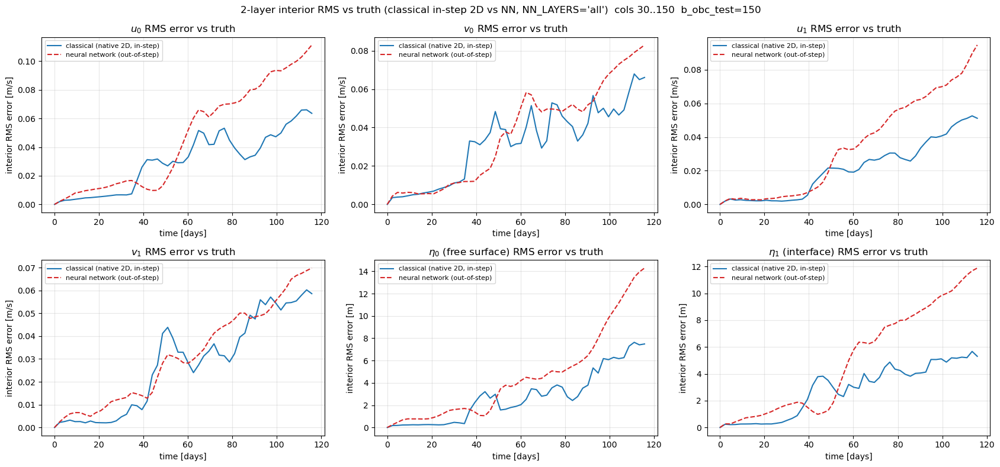

In [16]:
# ---- interior RMS vs the test-cadence truth, PER LAYER ----                      # [2L]
# [SPONGE-RMS] exclude every N/S sponge row (h_relax>0 at the OBC column)
_int_j = np.where(~sponge_row)[0]                       # rows outside the N/S sponge layer
jj = slice(int(_int_j.min()), int(_int_j.max()) + 1)
ii = slice(int(west_cols.max()) + 1, int(b_obc_test) + 1)
nfr = min(len(time_t), len(t_c), len(t_n))

def rms_err(A_scheme, A_truth, k_layer=0):              # (T,nk,nj,ni) stacks
    d = A_scheme[:nfr, k_layer, jj, ii] - A_truth[:nfr, k_layer, jj, ii]
    return np.sqrt(np.nanmean(d**2, axis=(1, 2)))

def rms_err2(A_scheme, A_truth):                        # [2L] (T,nj,ni) stacks (already layer-free, e.g. eta)
    d = A_scheme[:nfr, jj, ii] - A_truth[:nfr, jj, ii]
    return np.sqrt(np.nanmean(d**2, axis=(1, 2)))

# [2L] physical interfaces from the thickness stacks -- NOT h[0]-D (that is only eta at nk=1).
# [2L] eta0 is the free-surface DISPLACEMENT (rest value 0) and eta1 the interface
# [2L] DISPLACEMENT from its rest depth -Ho[0] (rest value 0), matching the 2-layer Orlanski
# [2L] notebook's `h1 - D + Ho[0]` (identical at flat D, since D = Ho[0] + Ho[1]).
# [2L] NOTE: eta1_of assumes FLAT bathymetry via the scalar Ho[1]; with bowl_topog() it would
# [2L] need `hh[:,1] - (M.D - M.Ho[0])`. Constant offsets cancel in the RMS difference anyway.
def eta0_of(hh): return hh[:nfr].sum(axis=1) - M.D[None]        # [2L] free surface  = h0 + h1 - D
def eta1_of(hh): return hh[:nfr, 1] - M.Ho[1]                   # [2L] interface displacement = h1 - Ho[1] (flat D)

td = t_c[:nfr] / 86400.0                                 # time axis [days]

# rows of the figure: (label, unit, classical series, NN series)
_panels = []
for _k in range(M.nk):                                                                  # [2L] per-layer u, v
    _panels.append((rf'$u_{_k}$', 'm/s', rms_err(u_c, u_t, _k), rms_err(u_n, u_t, _k)))
    _panels.append((rf'$v_{_k}$', 'm/s', rms_err(v_c, v_t, _k), rms_err(v_n, v_t, _k)))
_panels.append((r'$\eta_0$ (free surface)', 'm',                                        # [2L] barotropic mass
                rms_err2(eta0_of(h_c), eta0_of(h_t)), rms_err2(eta0_of(h_n), eta0_of(h_t))))
_panels.append((r'$\eta_1$ (interface)', 'm',                                           # [2L] baroclinic mass
                rms_err2(eta1_of(h_c), eta1_of(h_t)), rms_err2(eta1_of(h_n), eta1_of(h_t))))

fig, axs = plt.subplots(2, 3, figsize=(17, 8))
for a, (lab, unit, e1, e2) in zip(axs.ravel(), _panels):
    a.plot(td, e1, 'C0-',  label='classical (native 2D, in-step)')
    a.plot(td, e2, 'C3--', label='neural network (out-of-step)')
    a.set_xlabel('time [days]'); a.set_ylabel(f'interior RMS error [{unit}]')
    a.set_title(rf'{lab} RMS error vs truth'); a.legend(fontsize=8); a.grid(alpha=.3)
fig.suptitle(f'2-layer interior RMS vs truth (classical in-step 2D vs NN, NN_LAYERS={NN_LAYERS!r})  '
             f'cols {ii.start}..{ii.stop-1}  b_obc_test={int(b_obc_test)}')
fig.tight_layout()

print(f'{"quantity":24s}  {"classical":>12s}  {"NN":>12s}   {"NN/classical":>12s}')      # [2L] final-time table
for lab, unit, e1, e2 in _panels:
    _r = e2[-1] / e1[-1] if e1[-1] else np.nan
    print(f'{lab:24s}  {e1[-1]:12.4e}  {e2[-1]:12.4e}   {_r:12.2f}')
print('[2L] NN/classical > 1 means the network is WORSE than the analytic Orlanski on that quantity.')

# [2L] persist the verdict + the exact provenance that produced it. Cells only printed/plotted
# [2L] before, so a knob sweep left nothing comparable behind.
_res_path = P(f'nn_test_results_{KNOB_TAG}.npz')                                          # [2L]
np.savez_compressed(_res_path,                                                            # [2L]
    labels=np.array([p[0] for p in _panels]), t_days=td,
    rms_classical=np.array([p[2] for p in _panels]), rms_nn=np.array([p[3] for p in _panels]),
    ckpt=str(CKPT_LOAD), model_from=str(MODEL_FROM), config=str(CONFIG),
    nn_layers=str(NN_LAYERS), ext_mode=str(EXT_MODE), alpha_in_source=str(ALPHA_IN_SOURCE),
    alpha_in=float(ALPHA_IN), b_obc_test=int(b_obc_test), run_params=np.array(test_params, dtype=float),
    g=M.g, Ho=M.Ho, nk=M.nk)
print('[2L] results + provenance saved ->', _res_path)

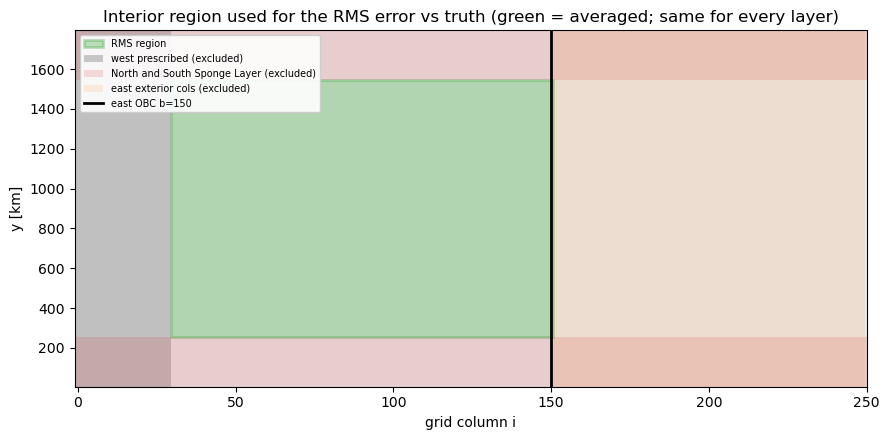

In [17]:
# RMS error region schematic
from matplotlib.patches import Rectangle as _Rect
_rows = np.arange(M.nj)[jj]                                             # kept y-rows
_cols = np.arange(M.ni)[ii]                                             # kept interior x-cols
_jlo, _jhi = int(_rows.min()), int(_rows.max())                         # row bounds (incl.)
_ilo, _ihi = int(_cols.min()), int(_cols.max())                         # col bounds (incl.)
_ykm = M.yh1 / 1e3                                                      # row centres [km]

figd, axd = plt.subplots(figsize=(9, 4.5))
axd.set_facecolor('0.92')                                              # full domain = light grey (excluded)
axd.add_patch(_Rect((_ilo - .5, _ykm[_jlo]),                           # green = averaged region
                    (_ihi - _ilo + 1), (_ykm[_jhi] - _ykm[_jlo]),
                    facecolor='C2', alpha=0.30, edgecolor='C2', lw=2,
                    label='RMS region'))
axd.axvspan(int(west_cols.min()) - .5, int(west_cols.max()) + .5,      # west prescribed band
            color='0.55', alpha=0.45, lw=0, label='west prescribed (excluded)')
axd.axhspan(_ykm[0], _ykm[_jlo], color='C3', alpha=0.15, lw=0,         # S sponge band
            label='North and South Sponge Layer (excluded)')
axd.axhspan(_ykm[_jhi], _ykm[-1], color='C3', alpha=0.15, lw=0)        # N sponge band
axd.axvspan(int(b_obc_test) + .5, M.ni - .5, color='C1', alpha=0.12, lw=0,
            label='east exterior cols (excluded)')
axd.axvline(int(b_obc_test), color='k', lw=2, label=f'east OBC b={int(b_obc_test)}')
axd.set_xlim(-1, M.ni); axd.set_ylim(_ykm[0], _ykm[-1])
axd.set_xlabel('grid column i'); axd.set_ylabel('y [km]')
axd.set_title('Interior region used for the RMS error vs truth (green = averaged; same for every layer)')
axd.legend(loc='upper left', fontsize=7, framealpha=0.9)
figd.tight_layout()

### Interior-summed 2-layer energy: control vs 2D Orlanski vs NN  `[2L]`

Kinetic energy sums **both** layers, `KE = ½ Σₖ hₖ(uₖ² + vₖ²)`. The 2-layer available
potential energy is the quadratic form matching the model's Montgomery potentials,
`APE = ½g₀η₀² + ½g'η₁²` — the first term is barotropic (free-surface), the second baroclinic
(interface). The 1-layer notebook's `½gη²` with `η = h − D` is **wrong at nk=2**.

control (truth)     final KE=2.0503e+13  PE=7.7755e+15  total=7.7961e+15  [m^5 s^-2]
2D Orlanski         final KE=2.0195e+13  PE=7.7821e+15  total=7.8023e+15  [m^5 s^-2]
neural network      final KE=2.5212e+13  PE=7.9069e+15  total=7.9321e+15  [m^5 s^-2]
2D Orlanski         final DEVIATION from control: dKE=-3.072e+11  dPE=+6.569e+12  dTotal=+6.262e+12
neural network      final DEVIATION from control: dKE=+4.709e+12  dPE=+1.314e+14  dTotal=+1.361e+14


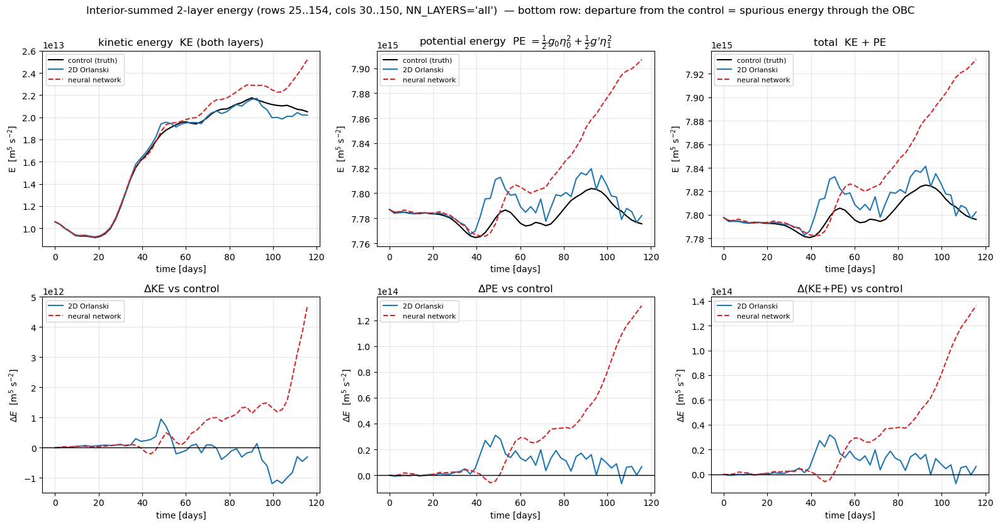

In [18]:
# ---- Energy time series: control (truth) vs 2D Orlanski vs neural network ----   # [2L] 2-layer form
dA = M.dx * M.dy                                        # cell area [m^2]

_int_j = np.where(~sponge_row)[0]                       # rows outside the N/S sponge (as in the RMS cell)
jj  = slice(int(_int_j.min()), int(_int_j.max()) + 1)
ii  = slice(int(west_cols.max()) + 1, int(b_obc_test) + 1)
nfr = min(len(time_t), len(t_c), len(t_n))

def energy_series(hh, uu, vv):
    """(T,nk,nj,ni) stacks -> (KE(t), PE(t)) summed over the interior region, ALL layers."""   # [2L]
    ke = np.zeros(nfr)
    for k in range(M.nk):                                                    # [2L] KE sums both layers
        h4, u4, v4 = hh[:nfr, k], uu[:nfr, k], vv[:nfr, k]
        # [2L][FIX] average the SQUARE (u^2) to h-points, as the module's KE() does via
        # [2L][FIX] _nb_q2v(u**2) = 0.5*(u^2 + ip1(u^2)). The 1-layer notebooks roll the
        # [2L][FIX] un-squared velocity (0.5*(u4**2 + roll(u4,-1))), which mixes m/s with
        # [2L][FIX] m^2/s^2 and can go NEGATIVE. Verified: this form reproduces M.KE() exactly.
        u2 = 0.5 * (u4**2 + np.roll(u4**2, -1, axis=-1))   # u^2 averaged u-points -> h-points (as M.KE)
        v2 = 0.5 * (v4**2 + np.roll(v4**2, -1, axis=-2))   # v^2 averaged v-points -> h-points
        ke += (0.5 * h4 * (u2 + v2))[:, jj, ii].sum(axis=(1, 2)) * dA
    # [2L] PE = 1/2 * sum_k g_k * eta_k^2  with eta_k the ABSOLUTE interface positions of the
    # [2L] module's own recursion (eta[1]=h1-D, eta[0]=eta[1]+h0), matching M0=g0*eta0,
    # [2L] M1=M0+g'*eta1. There is no cross term. This is NOT the 1-layer 1/2 g (h-D)^2.
    # [2L][FIX] eta1 must be ABSOLUTE (h1-D), not the displacement (h1-Ho[1]): the two differ
    # [2L][FIX] by a linear term -g1*Ho[0]*eta1', which is constant only over a CLOSED domain.
    # [2L][FIX] This box is OPEN (fluid crosses the OBC), and that term dominates the signal.
    # [2L][FIX] Verified by conservation: KE+PE with absolute eta drifts 3.9e-8 relative over a
    # [2L][FIX] frictionless closed run vs 3.1e-3 using the displacement form.
    eta0 = hh[:nfr].sum(axis=1) - M.D[None]                                  # [2L] free surface  = eta[0] (rest 0)
    eta1 = hh[:nfr, 1] - M.D[None]                                           # [2L] interface     = eta[1] (rest -Ho[0])
    pe  = (0.5 * float(M.g[0]) * eta0**2)[:, jj, ii].sum(axis=(1, 2)) * dA   # [2L] barotropic (free-surface)
    pe += (0.5 * float(M.g[1]) * eta1**2)[:, jj, ii].sum(axis=(1, 2)) * dA   # [2L] baroclinic (interface)
    return ke, pe

runs_E = [('control (truth)', h_t, u_t, v_t, 'k',  '-'),
          ('2D Orlanski',     h_c, u_c, v_c, 'C0', '-'),
          ('neural network',  h_n, u_n, v_n, 'C3', '--')]
td = time_t[:nfr] / 86400.0

_E = {}                                                                    # [2L] keep series for the deviation row
fig, ax = plt.subplots(2, 3, figsize=(16, 8.5))                            # [2L] row 0 = absolute, row 1 = deviation
for name, hh, uu, vv, color, ls in runs_E:
    ke, pe = energy_series(hh, uu, vv)
    _E[name] = (ke, pe)
    ax[0, 0].plot(td, ke,      color=color, ls=ls, label=name)
    ax[0, 1].plot(td, pe,      color=color, ls=ls, label=name)
    ax[0, 2].plot(td, ke + pe, color=color, ls=ls, label=name)
    print(f'{name:18s}  final KE={ke[-1]:.4e}  PE={pe[-1]:.4e}  total={ke[-1] + pe[-1]:.4e}  [m^5 s^-2]')
for a, ttl in zip(ax[0], ['kinetic energy  KE (both layers)',
                          r'potential energy  PE $=\frac{1}{2}g_0\eta_0^2 + \frac{1}{2}g^\prime\eta_1^2$',
                          'total  KE + PE']):
    a.set_xlabel('time [days]'); a.set_ylabel(r'E  [m$^5$ s$^{-2}$]'); a.set_title(ttl); a.legend(fontsize=8); a.grid(alpha=.3)

# [2L] The absolute panels are dominated by the balanced mean state (the tilted interface
# [2L] carries a huge constant PE), so the three curves overlap. The OBC signal is the
# [2L] DEVIATION FROM THE CONTROL -- that is what "spurious energy through the OBC" means.
_ke0, _pe0 = _E['control (truth)']
for name, hh, uu, vv, color, ls in runs_E[1:]:
    ke, pe = _E[name]
    ax[1, 0].plot(td, ke - _ke0,               color=color, ls=ls, label=name)
    ax[1, 1].plot(td, pe - _pe0,               color=color, ls=ls, label=name)
    ax[1, 2].plot(td, (ke + pe) - (_ke0 + _pe0), color=color, ls=ls, label=name)
    print(f'{name:18s}  final DEVIATION from control: dKE={ke[-1]-_ke0[-1]:+.3e}  '
          f'dPE={pe[-1]-_pe0[-1]:+.3e}  dTotal={(ke[-1]+pe[-1])-(_ke0[-1]+_pe0[-1]):+.3e}')
for a, ttl in zip(ax[1], [r'$\Delta$KE vs control', r'$\Delta$PE vs control', r'$\Delta$(KE+PE) vs control']):
    a.axhline(0, color='k', lw=1)
    a.set_xlabel('time [days]'); a.set_ylabel(r'$\Delta E$  [m$^5$ s$^{-2}$]'); a.set_title(ttl); a.legend(fontsize=8); a.grid(alpha=.3)

fig.suptitle(f'Interior-summed 2-layer energy (rows {jj.start}..{jj.stop-1}, cols {ii.start}..{ii.stop-1}, '
             f'NN_LAYERS={NN_LAYERS!r})  — bottom row: departure from the control = spurious energy through the OBC')
fig.tight_layout()

### Per-layer phase speed: what the network applied vs the classical scheme  `[2L]`

Both drivers record the **applied** Courant numbers per (field, layer, row, step), so the
network's `(rx, ry)` can be compared directly against the analytic scheme's, layer by layer.
Physical speed: `c_x = rx·dx/dt`, `c_y = ry·dy/dt`. Note the NN path applies its `rx`
**unclamped**, while the in-step classical scheme clamps `rx ≤ 3, |ry| ≤ 3`.

  [2L] classical       layer 0: 5.53% of points masked (|c_x| > 8.84 m/s)
  [2L] neural network  layer 0: 0.00% of points masked (|c_x| > 8.84 m/s)
  [2L] classical       layer 1: 5.61% of points masked (|c_x| > 8.84 m/s)
  [2L] neural network  layer 1: 0.00% of points masked (|c_x| > 8.84 m/s)


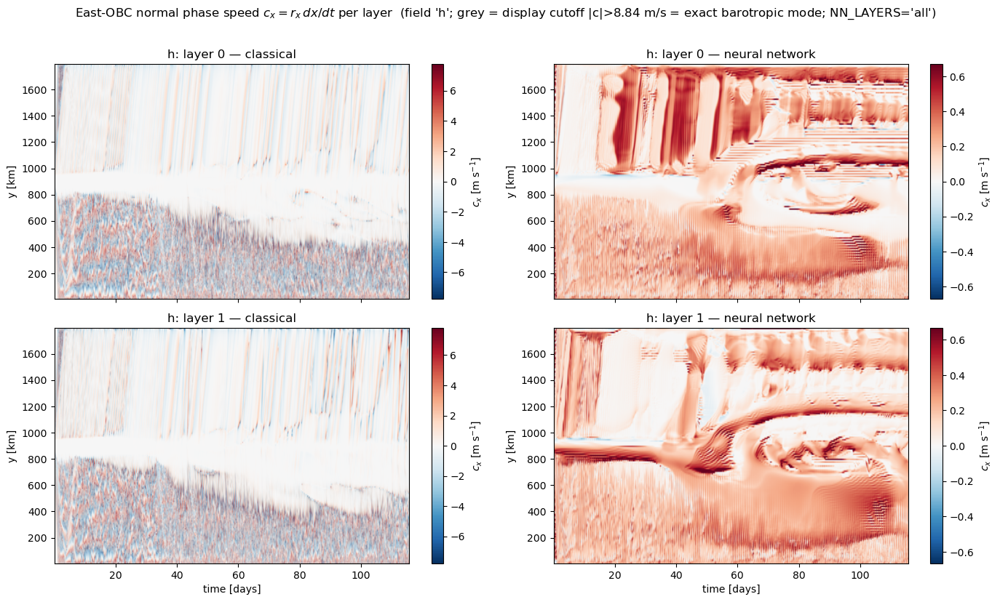

layer 0  h:  classical mean c_x = +0.024 m/s (|c|max 642.8)   NN mean c_x = +0.186 m/s (|c|max 2.4)
layer 1  h:  classical mean c_x = +0.020 m/s (|c|max 2259.6)   NN mean c_x = +0.175 m/s (|c|max 2.2)
[2L] classical clamp activity (h): rx>=3 on 0.001% of points, |ry|>=3 on 0.001%  (max rx=3.000, max|ry|=10.939)
[2L] inflow fraction (h): 52.7% of (row,step) points -- on these the recorded rx is DIAGNOSED, not applied (the column is set by the nudge/persistence branch).


In [19]:
# [2L] Hovmoller of the applied normal phase speed c_x, classical vs NN, per layer.
FIELD = 'h'                                    # [2L] 'h' | 'u' | 'v'
dt_   = float(test_params[0])
dxm, dym = M.dx, M.dy
_key  = f'rx_{FIELD}_row'
assert _key in rx_diag_c and _key in diag_n, f'{_key} missing from a run diag'

_ykm = (M.yq1 if FIELD == 'v' else M.yh1) / 1e3        # v lives on the q-grid; u/h on the h-grid
_nrun = min(rx_diag_c[_key].shape[0], diag_n[_key].shape[0])
_tdays = np.arange(1, _nrun + 1) * dt_ / 86400.0
# [2L] DISPLAY cutoff only (not a scheme limit): grey out |c_x| above the exact fastest mode.
# [2L] M.cg = sqrt(g0*sum(Ho)) is the weak-stratification formula and UNDERSTATES it here
# [2L] (g'/g0 = 0.75), so use the eigenvalue -- recomputed from M so it also works on reload.
_Bm = np.array([[M.g[0]*M.Ho[0],  M.g[0]*M.Ho[0]],
                [M.g[0]*M.Ho[1], (M.g[0]+M.g[1])*M.Ho[1]]])                  # [2L]
C_BT, C_BC = np.sqrt(np.sort(np.linalg.eigvals(_Bm))[::-1])                  # [2L] exact barotropic / baroclinic
C_MAX = float(C_BT)                                                          # [2L] display cutoff [m/s]

fig, axs = plt.subplots(M.nk, 2, figsize=(14, 4.2 * M.nk), sharex=True, squeeze=False)
for k in range(M.nk):                                                        # [2L] one row of panels per layer
    for col, (name, dg) in enumerate([('classical', rx_diag_c), ('neural network', diag_n)]):
        cx_raw = dg[_key][:_nrun, k, :].T * dxm / dt_                        # (nj, nrun)
        cx = np.where(np.abs(cx_raw) > C_MAX, np.nan, cx_raw)                # [2L] display mask
        _frac = float(np.mean(np.abs(cx_raw) > C_MAX))                       # [2L] report what was hidden
        cmap = plt.get_cmap('RdBu_r').copy(); cmap.set_bad('lightgray')
        vlm = float(np.nanpercentile(np.abs(cx), 99.0)) if np.any(np.isfinite(cx)) else 1.0
        if not np.isfinite(vlm) or vlm == 0:                                 # [2L] nan is truthy -> `or 1.0` would NOT catch it
            vlm = 1.0                                                        # [2L]
        print(f'  [2L] {name:15s} layer {k}: {_frac*100:.2f}% of points masked (|c_x| > {C_MAX:.2f} m/s)')
        im = axs[k, col].imshow(cx, origin='lower', aspect='auto', cmap=cmap,
                                extent=[_tdays[0], _tdays[-1], _ykm[0], _ykm[-1]],
                                vmin=-vlm, vmax=vlm, interpolation='bilinear')
        fig.colorbar(im, ax=axs[k, col], label=r'$c_x$ [m s$^{-1}$]')
        axs[k, col].set_title(f'{FIELD}: layer {k} — {name}')
        axs[k, col].set_ylabel('y [km]')
for a in axs[-1, :]:
    a.set_xlabel('time [days]')
fig.suptitle(f'East-OBC normal phase speed $c_x=r_x\\,dx/dt$ per layer  '
             f'(field {FIELD!r}; grey = display cutoff |c|>{C_MAX:.2f} m/s = exact barotropic mode; '
             f'NN_LAYERS={NN_LAYERS!r})')
fig.tight_layout(rect=(0, 0, 1, 0.97))
plt.show()

for k in range(M.nk):                                                        # [2L] quick per-layer summary
    _cc = rx_diag_c[_key][:_nrun, k, :] * dxm / dt_
    _cn = diag_n[_key][:_nrun, k, :] * dxm / dt_
    print(f'layer {k}  {FIELD}:  classical mean c_x = {np.nanmean(_cc):+.3f} m/s (|c|max {np.nanmax(np.abs(_cc)):.1f})   '
          f'NN mean c_x = {np.nanmean(_cn):+.3f} m/s (|c|max {np.nanmax(np.abs(_cn)):.1f})')
# [2L] how often does the classical in-step clamp (rx<=3, |ry|<=3) actually bite? The NN path
# [2L] and the top/deep analytic fallback apply NO clamp, so if this is ~0 the two paths are
# [2L] numerically equivalent on outflow and 'top'/'deep' really is NN-vs-classical.
_rxc = rx_diag_c[_key][:_nrun]; _ryc = rx_diag_c[f'ry_{FIELD}_row'][:_nrun]
print(f'[2L] classical clamp activity ({FIELD}): rx>=3 on {np.mean(_rxc >= 3)*100:.3f}% of points, '
      f'|ry|>=3 on {np.mean(np.abs(_ryc) >= 3)*100:.3f}%  (max rx={_rxc.max():.3f}, max|ry|={np.abs(_ryc).max():.3f})')
print(f'[2L] inflow fraction ({FIELD}): {np.mean(_rxc < 0)*100:.1f}% of (row,step) points -- on these the '
      f'recorded rx is DIAGNOSED, not applied (the column is set by the nudge/persistence branch).')

### Animations  `[2L]` (optional — set `ANIM_FIELD` / `K_LAYER` and run)

In [20]:
# ---- animation comparison: control (truth) | 2D Orlanski | neural network ----   # [2L]
import os
import matplotlib as mpl
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

mpl.rcParams['animation.embed_limit'] = 200.0

ANIM_FIELD   = 'pv'      # 'pv' | 'h' | 'u' | 'v' | 'eta0' | 'eta1'    [2L] +eta0/eta1 (2-layer interfaces)
SHOW_CONTROL = True     # include the control-truth panel
K_LAYER      = 0        # [2L] layer for pv/h/u/v (ignored by eta0/eta1, which are column quantities)
STRIDE       = None     # None -> auto (~60 frames); set 1 to show every sample
SAVE_GIF     = True

bx    = int(b_obc_test)
jcut  = slice(2, -2)
_clocks = ([time_t] if SHOW_CONTROL else []) + [t_c, t_n]
nfr   = min(len(t) for t in _clocks)
STRIDE = STRIDE or max(1, int(np.ceil(nfr / 60)))
flist = list(range(0, nfr, STRIDE))

def _pv_frames(hh, uu, vv):                         # PV rebuilt per displayed frame, cropped
    return np.array([M.q(h=hh[n], u=uu[n], v=vv[n], k=K_LAYER)[jcut, :bx + 1] for n in flist])

def _raw_frames(arr):                               # prognostic field, layer K_LAYER, cropped
    return np.array([arr[n][K_LAYER][jcut, :bx + 1] for n in flist])

def _eta0_frames(hh):                               # [2L] free surface eta0 = h0+h1-D
    return np.array([(hh[n].sum(axis=0) - M.D)[jcut, :bx + 1] for n in flist])

def _eta1_frames(hh):                               # [2L] interface displacement eta1 = h1-H2
    return np.array([(hh[n][1] - M.Ho[1])[jcut, :bx + 1] for n in flist])

#              long name                        colorbar label                              (x, y) grid        cmap      signed  frame builder
FIELD_DEFS = {
    'pv'  : (r'potential vorticity $q$', r'$q=(f+v_x-u_y)/h$  [s$^{-1}$m$^{-1}$]', (M.xq1, M.yq1), 'viridis', False, lambda hh, uu, vv: _pv_frames(hh, uu, vv)),
    'h'   : (r'layer thickness $h$',     r'$h$  [m]',                              (M.xh1, M.yh1), 'viridis', False, lambda hh, uu, vv: _raw_frames(hh)),
    'u'   : (r'zonal velocity $u$',      r'$u$  [m/s]',                            (M.xq1, M.yh1), 'RdBu_r',  True,  lambda hh, uu, vv: _raw_frames(uu)),
    'v'   : (r'meridional velocity $v$', r'$v$  [m/s]',                            (M.xh1, M.yq1), 'RdBu_r',  True,  lambda hh, uu, vv: _raw_frames(vv)),
    'eta0': (r'free surface $\eta_0$',   r'$\eta_0 = h_0+h_1-D$  [m]',             (M.xh1, M.yh1), 'RdBu_r',  True,  lambda hh, uu, vv: _eta0_frames(hh)),   # [2L]
    'eta1': (r'interface $\eta_1$',      r'$\eta_1 = h_1-H_2$  [m]',               (M.xh1, M.yh1), 'RdBu_r',  True,  lambda hh, uu, vv: _eta1_frames(hh)),   # [2L]
}
f_long, cbar_lab, (xg, yg), f_cmap, f_signed, f_frames = FIELD_DEFS[ANIM_FIELD]

runs = [('2D Orlanski',    f_frames(h_c, u_c, v_c)),
        ('neural network', f_frames(h_n, u_n, v_n))]
if SHOW_CONTROL:
    runs = [('control (truth)', f_frames(h_t, u_t, v_t))] + runs

xkm, ykm = xg[:bx + 1] / 1e3, yg[jcut] / 1e3
ext  = [xkm.min(), xkm.max(), ykm.min(), ykm.max()]
ref  = runs[0][1]                                   # color range from the first panel (truth when shown)
if f_signed:
    vmax = float(np.abs(ref).max()); vmin = -vmax   # diverging fields: symmetric about 0
else:
    vmin, vmax = float(ref.min()), float(ref.max())
td_a = (time_t if SHOW_CONTROL else t_c)[:nfr] / 86400.0

npanel = len(runs)
fig, axs = plt.subplots(1, npanel, figsize=(5 * npanel, 5), constrained_layout=True, squeeze=False)
axs = axs.ravel()                                   # [2L] keep axs iterable when npanel==1
ims = []
for ax, (title, fld) in zip(axs, runs):
    im = ax.imshow(fld[0], origin='lower', extent=ext, cmap=f_cmap,
                   vmin=vmin, vmax=vmax, aspect='auto', interpolation='bilinear')
    ax.axvline(xkm[-1], color='k', ls='--', lw=1.2)
    ax.set_title(title); ax.set_xlabel('x [km]'); ax.set_ylabel('y [km]')
    ims.append(im)
fig.colorbar(ims[0], ax=list(axs), shrink=0.85, label=cbar_lab)
ttl = fig.suptitle('')

_klab = '' if ANIM_FIELD in ('eta0', 'eta1') else f', layer k={K_LAYER}'    # [2L]

def _update(i):
    for im, (_, fld) in zip(ims, runs):
        im.set_data(fld[i])
    ttl.set_text(f'{f_long}  |  t = {td_a[flist[i]]:.1f} days   (b_obc_test={bx}{_klab}, dashed line)')
    return ims

anim = FuncAnimation(fig, _update, frames=len(flist), interval=150, blit=False)
plt.close(fig)
if SAVE_GIF:
    _OUT = P('animations'); os.makedirs(_OUT, exist_ok=True)
    # [2L] KNOB_TAG in the name: a knob sweep with RUN_CONTROL=False reuses ONE DATA_DIR,
    # [2L] so without it run 2 would silently overwrite run 1's GIF.
    _gif = os.path.join(_OUT, f'obc2l_compare_{ANIM_FIELD}_k{K_LAYER}_{npanel}panel_{KNOB_TAG}.gif')   # [2L]
    anim.save(_gif, writer=PillowWriter(fps=7), dpi=90)
    print('[ANIM] saved ->', _gif)
print(f'[ANIM] field={ANIM_FIELD}{_klab}, {len(flist)} frames (stride {STRIDE}), range [{vmin:.3g}, {vmax:.3g}]')
HTML(anim.to_jshtml())

[ANIM] saved -> D:\Documents\College\Research\Oceangrophy\Princeton_Summer\OSSWEM\Neural_Net\Stored_Runs\20260716_2346_2layer_test_multifield_all_frozen_ic_a-notebook\animations\obc2l_compare_pv_k0_3panel_all_frozen_ic_a-notebook.gif
[ANIM] field=pv, layer k=0, 51 frames (stride 1), range [1.58e-07, 3.9e-07]


### Free memory  `[2L]` — optional, run when done iterating

The west-BC stores (`h/u/v_bc_all`, ~13 GB at 50k steps) are kept resident so you can re-run
the rollouts with a different `EXT_MODE` / `NN_LAYERS` without regenerating the control. Run
this cell to release them once you're finished — after it, re-running the *classical vs NN*
cell needs a fresh control run (`RUN_CONTROL=True`) or a reload (`RUN_CONTROL=False`).

In [21]:
# [2L] release the big west-BC arrays. Safe to skip; only run when you're done re-running rollouts.
import gc                                                                      # [2L]
_freed = []                                                                    # [2L]
for _nm in ('h_bc_t', 'u_bc_t', 'v_bc_t', 'h_bc_all', 'u_bc_all', 'v_bc_all'):
    if _nm in globals():
        del globals()[_nm]; _freed.append(_nm)
gc.collect()
print(f'[2L] freed: {_freed}  -- re-running the rollout cell now needs RUN_CONTROL=True or a reload.')

[2L] freed: ['h_bc_t', 'u_bc_t', 'v_bc_t', 'h_bc_all', 'u_bc_all', 'v_bc_all']  -- re-running the rollout cell now needs RUN_CONTROL=True or a reload.
